# Images registration

## Imports and pre-processing 

In [1]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np

from skimage.io import imread
from skimage.feature import SIFT, plot_matches, match_descriptors
from skimage.measure import ransac
from skimage.transform import AffineTransform, warp
from skimage.exposure import equalize_adapthist

plt.rcParams['figure.figsize'] = [9, 9]

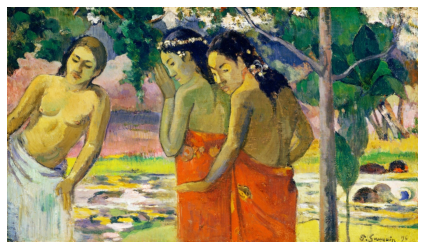

In [5]:
img_url = 'https://raw.githubusercontent.com/lmartinez2001/Resources/main/res/images/style-images/tahiti_guaguin.jpg'
im_src = imread(img_url).astype(np.float64)
im_src /= 255
plt.imshow(im_src)
plt.axis('off')
plt.tight_layout()

### Channels misalignment

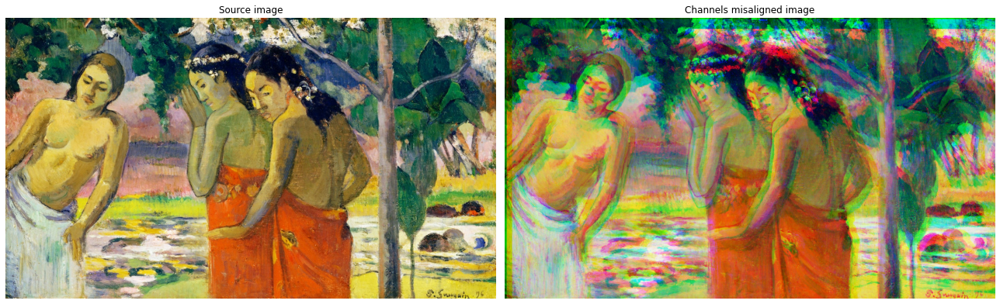

In [6]:
def shift_channel(im, channel, shift_row, shift_col):
    if channel == 'r':
        ch = im[:,:,0]
        shifted_ch = np.roll(ch, (shift_row, shift_col), axis=(0,1))[shift_row:, shift_col:]
        im[:,:,0] = np.zeros_like(ch)
        im[:,:,0][shift_row:, shift_col:] = shifted_ch
    elif channel == 'g':
        ch = im[:,:,1]
        shifted_ch = np.roll(ch, (shift_row, shift_col), axis=(0,1))[shift_row:, shift_col:]
        im[:,:,1] = np.zeros_like(ch)
        im[:,:,1][shift_row:, shift_col:] = shifted_ch

    elif channel == 'b':
        ch = im[:,:,2]
        shifted_ch = np.roll(ch, (shift_row, shift_col), axis=(0,1))[shift_row:, shift_col:]
        im[:,:,2] = np.zeros_like(ch)
        im[:,:,2][shift_row:, shift_col:] = shifted_ch
    else:
        raise ValueError('The channel value must be r, g or b')

    return im


ch2idx = {'r':0, 'g':1, 'b':2}

im = im_src.copy()
im = shift_channel(im, 'r', 27, 5)
im = shift_channel(im, 'b', 3, 18)
fig, ax = plt.subplots(1,2, figsize=(18,7))
ax[0].imshow(im_src)
ax[0].set_title('Source image')
ax[0].axis('off')

ax[1].imshow(im)
ax[1].set_title('Channels misaligned image')
ax[1].axis('off')
plt.tight_layout()
plt.show()

## Feature based registration

We extract the SIFT descriptors of red, green and blue images.

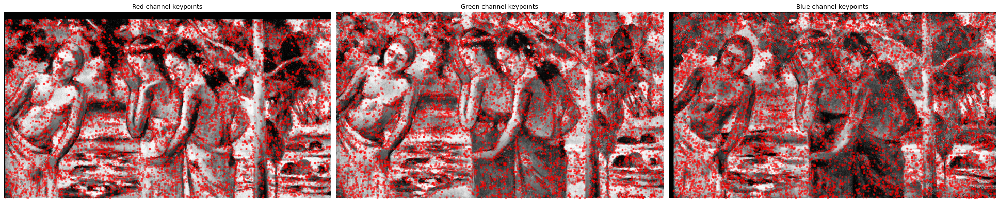

In [13]:
orb_extractor = SIFT()

im_channels = [im[:,:,i] for i in range(3)]
im_channels_equalized = [equalize_adapthist(im_channels[i]) for i in range(3)]

def extract_features(im):
    orb_extractor.detect_and_extract(im)
    kpts = orb_extractor.keypoints
    desc = orb_extractor.descriptors
    return {'keypoints':kpts, 'descriptors':desc}


channels_features = [extract_features(im_channels_equalized[i]) for i in range(3)]

fig, ax = plt.subplots(1, 3, figsize=(27,7))
for i, color in enumerate(['Red', 'Green', 'Blue']):
    ax[i].imshow(im_channels_equalized[i], cmap='gray')
    ax[i].axis('off')
    ax[i].set_title(f'{color} channel keypoints')
    ax[i].scatter(channels_features[i]['keypoints'][:,1], channels_features[i]['keypoints'][:,0], c='red', alpha=0.4, marker='.')
plt.tight_layout()

C:\Users\Louis\AppData\Local\Temp\ipykernel_18796\1439887017.py:17: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(


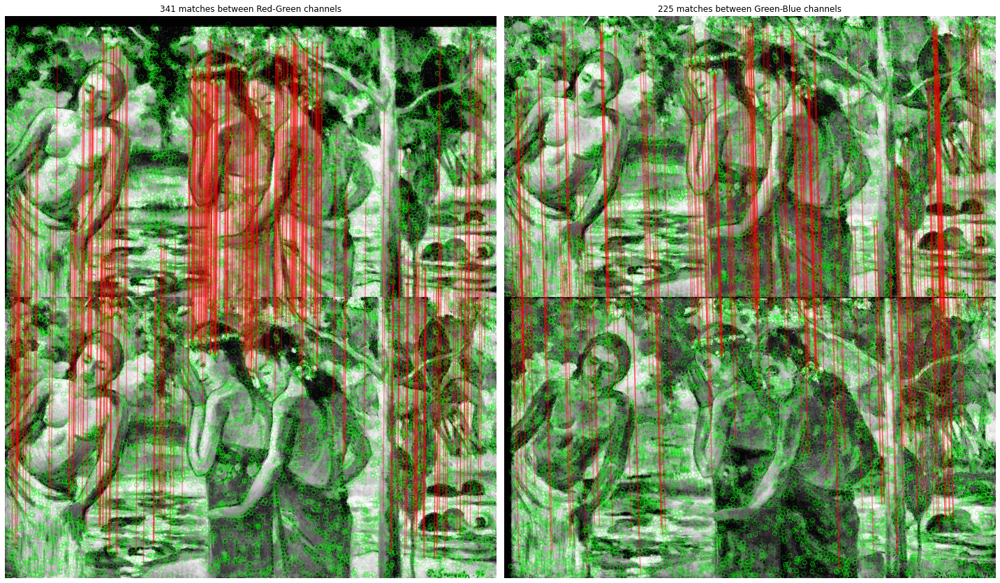

In [14]:
matches_rg = match_descriptors(
    channels_features[ch2idx['r']]['descriptors'], 
    channels_features[ch2idx['g']]['descriptors'],
    max_ratio=0.4)

matches_gb = match_descriptors(
    channels_features[ch2idx['g']]['descriptors'], 
    channels_features[ch2idx['b']]['descriptors'],
    max_ratio=0.6)

fig, ax = plt.subplots(1, 2, figsize=(20, 20))
for i, (colors, matches) in enumerate([('Red-Green', matches_rg), ('Green-Blue', matches_gb)]):
    im1 = im_channels_equalized[i]
    im2 = im_channels_equalized[i+1]
    kpts1 = channels_features[i]['keypoints']
    kpts2 = channels_features[i+1]['keypoints']
    plot_matches(
        ax[i], 
        im1, 
        im2, 
        kpts1, 
        kpts2, 
        matches,
        alignment='vertical',
        only_matches=False, 
        matches_color=[1.,0.,0.,.4], 
        keypoints_color=[0.,1.,0.,.3])
    ax[i].set_title(f'{matches.shape[0]} matches between {colors} channels')
    ax[i].axis('off')
plt.tight_layout()


In [17]:
kpts_red = channels_features[ch2idx['r']]['keypoints']
kpts_green = channels_features[ch2idx['g']]['keypoints']
kpts_blue = channels_features[ch2idx['b']]['keypoints']

# handle red-green matching
src = kpts_red[matches_rg[:,0]][:,::-1]
dest = kpts_green[matches_rg[:,1]][:,::-1]

model_rg, inliers_rg = ransac(
                            (src, dest), 
                            AffineTransform,
                            min_samples=8,
                            residual_threshold=0.2,
                            max_trials=300)

# handle green-blue matching
src = kpts_blue[matches_gb[:,1]][:,::-1]
dest = kpts_green[matches_gb[:,0]][:,::-1]

model_gb, inliers_gb = ransac(
                            (src, dest), 
                            AffineTransform,
                            min_samples=4,
                            residual_threshold=20,
                            max_trials=400)

C:\Users\Louis\AppData\Local\Temp\ipykernel_18796\589880747.py:9: FutureWarning: `plot_matches` is deprecated since version 0.23 and will be removed in version 0.25. Use `skimage.feature.plot_matched_features` instead.
  plot_matches(


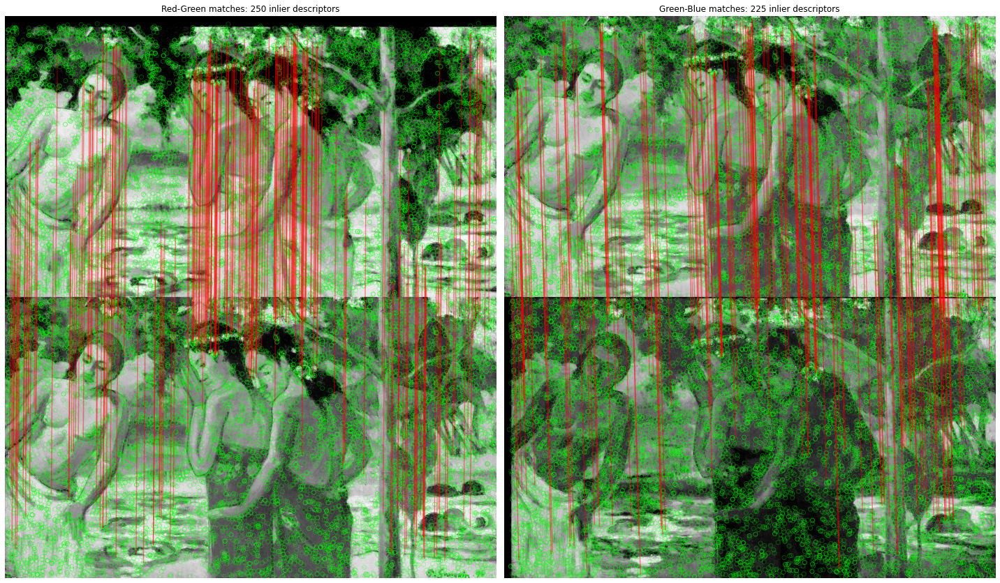

In [18]:
fig, ax = plt.subplots(1, 2, figsize=(20, 20))
for i, (colors, matches, inliers) in enumerate([('Red-Green', matches_rg, inliers_rg), ('Green-Blue', matches_gb, inliers_gb)]):
    ax[i].axis('off')
    ax[i].set_title(f'{colors} matches: {inliers.sum()} inlier descriptors')
    im1 = im_channels[i]
    im2 = im_channels[i+1]
    kpts1 = channels_features[i]['keypoints']
    kpts2 = channels_features[i+1]['keypoints']
    plot_matches(
        ax[i], 
        im1, 
        im2, 
        kpts1, 
        kpts2, 
        matches[inliers],
        alignment='vertical',
        matches_color=[1.,0.,0.,.4], 
        keypoints_color=[0.,1.,0.,.3])
plt.tight_layout()

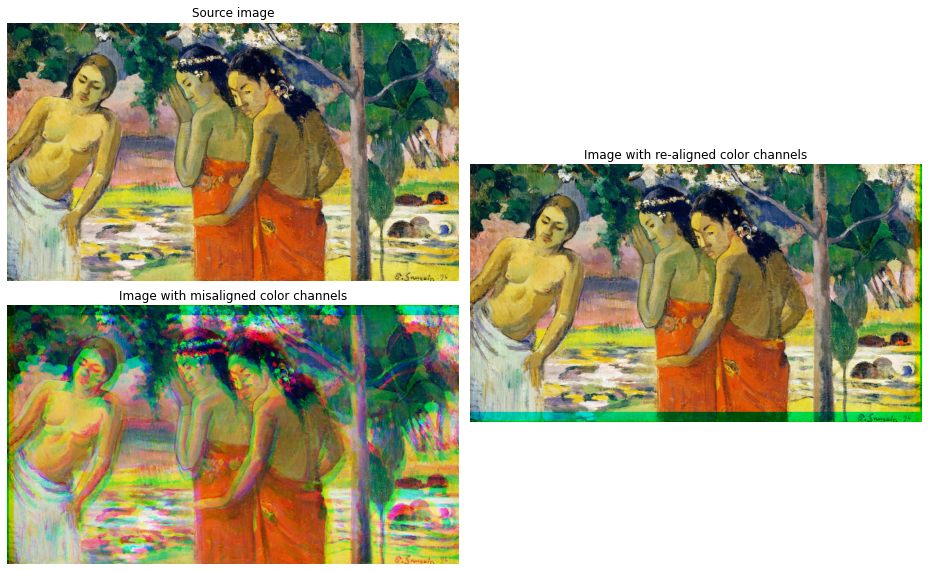

In [19]:
r_aligned = warp(im_channels[ch2idx['r']], model_rg.inverse)
r_aligned = (255 * r_aligned).astype(np.uint8)
b_aligned = warp(im_channels[ch2idx['b']], model_gb.inverse)
b_aligned = (255 * b_aligned).astype(np.uint8)

im_aligned = np.stack([r_aligned, (255 * im_channels[ch2idx['g']]).astype(np.uint8), b_aligned], axis=2)

fig, ax = plt.subplot_mosaic(
    '''
    AA..
    AACC
    BBCC
    BB..
    ''',
    figsize=(13,8))
ax['A'].imshow(im_src)
ax['A'].set_title('Source image')
ax['A'].axis('off')
ax['B'].imshow(im)
ax['B'].set_title('Image with misaligned color channels')
ax['B'].axis('off')
ax['C'].imshow(im_aligned)
ax['C'].set_title('Image with re-aligned color channels')
ax['C'].axis('off')
plt.tight_layout()
plt.show()